In [56]:
# import the package, and give it the alias "xr"
import xarray as xr

# we will also be using numpy and pandas, import both of these
import numpy as np
import pandas as pd

# for plotting, import matplotlib.pyplot
import matplotlib.pyplot as plt
# tell jupyter to display plots "inline" in the notebook
%matplotlib inline

In [41]:
import pandas as pd
import xarray as xr
import numpy as np

# Leer el archivo CSV
file_path = 'D:/Paper_Climate/Data/siguiente paper/ncf4/CDBC-MERRA2-1.csv'
df = pd.read_csv(file_path)

# Extraer las fechas y los datos
dates = pd.to_datetime(df['Date'])  # Convertir las fechas a datetime
data = df.drop(columns=['Date']).values

# Convertir a una matriz NumPy
precipitation_matrix = np.array(data)

# Verificar las dimensiones
n_days = len(dates)  # Número de días
n_points = precipitation_matrix.shape[1]  # Número de puntos

# Extraer las etiquetas de lonXlat
lon_lat_labels = df.columns[1:]  # Encabezados de longitud y latitud
lon_lat_coords = [label.split('X') for label in lon_lat_labels]

# Crear listas de longitudes y latitudes
longitudes = []
latitudes = []

for coord in lon_lat_coords:
    if len(coord) == 2:  # Asegurarse de que hay dos elementos
        longitudes.append(float(coord[0]))
        latitudes.append(float(coord[1]))

# Convertir a conjuntos para eliminar duplicados
longitudes_unicas = sorted(set(longitudes))
latitudes_unicas = sorted(set(latitudes))

# Crear un mapa de las coordenadas únicas a índices
lon_index = {lon: idx for idx, lon in enumerate(longitudes_unicas)}
lat_index = {lat: idx for idx, lat in enumerate(latitudes_unicas)}

# Inicializar la matriz 3D de precipitación
n_lon = len(longitudes_unicas)
n_lat = len(latitudes_unicas)
precipitation_data_3d = np.zeros((n_days, n_lat, n_lon))

# Llenar la matriz 3D con datos
for i, label in enumerate(lon_lat_labels):
    lon, lat = map(float, label.split('X'))
    lon_idx = lon_index[lon]
    lat_idx = lat_index[lat]
    precipitation_data_3d[:, lat_idx, lon_idx] = precipitation_matrix[:, i]

# Crear el DataArray con dimensiones separadas para latitud y longitud
precipitation_xr = xr.DataArray(
    precipitation_data_3d,
    coords=[dates, latitudes_unicas, longitudes_unicas],  # Coordenadas de tiempo, latitud y longitud
    dims=['time', 'lat', 'lon'],  # Dimensiones
    name='pcp',
    attrs={'units': 'mm', 'description': 'Daily precipitation data'}
)

# Crear un Dataset y agregar el DataArray
ds = xr.Dataset({'pcp': precipitation_xr})

# Guardar en formato NetCDF
#ds.to_netcdf('D:/Y/precipitation_data_with_lat_lon.nc')

# Verificar la estructura del DataArray
print(precipitation_xr)

<xarray.DataArray 'pcp' (time: 15705, lat: 7, lon: 8)>
array([[[0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [0.  , 1.47, 1.49, ..., 0.  , 0.  , 0.  ],
        [1.48, 1.5 , 1.52, ..., 0.  , 1.63, 1.66],
        ...,
        [0.  , 0.  , 1.57, ..., 1.64, 1.68, 0.  ],
        [0.  , 0.  , 0.  , ..., 1.65, 1.68, 0.  ],
        [0.  , 0.  , 0.  , ..., 1.65, 0.  , 0.  ]],

       [[0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [0.  , 0.15, 0.17, ..., 0.  , 0.  , 0.  ],
        [0.14, 0.16, 0.17, ..., 0.  , 0.23, 0.25],
        ...,
        [0.  , 0.  , 0.18, ..., 0.23, 0.24, 0.  ],
        [0.  , 0.  , 0.  , ..., 0.23, 0.24, 0.  ],
        [0.  , 0.  , 0.  , ..., 0.23, 0.  , 0.  ]],

       [[0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
        [0.  , 0.11, 0.12, ..., 0.  , 0.  , 0.  ],
        [0.11, 0.12, 0.13, ..., 0.  , 0.2 , 0.23],
        ...,
...
        ...,
        [0.  , 0.  , 5.03, ..., 5.53, 5.43, 0.  ],
        [0.  , 0.  , 0.  , ..., 5.48, 5.35, 0.  ],
        [0.  , 0. 

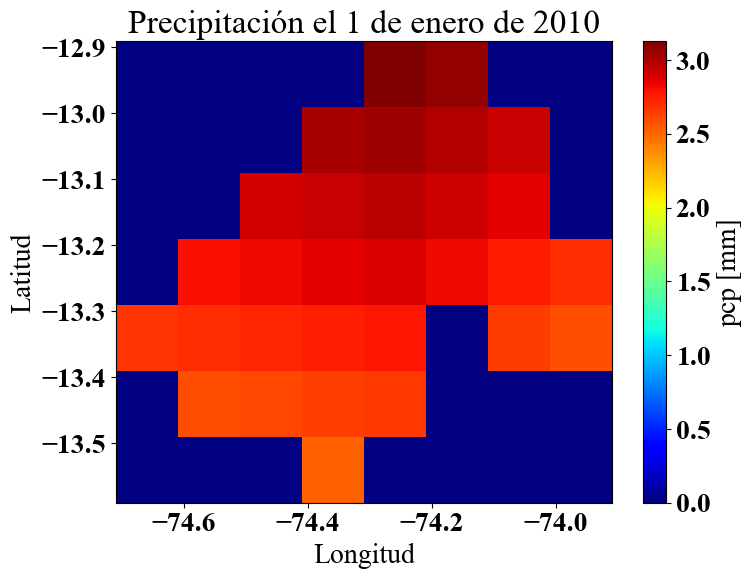

In [53]:
# Seleccionar los datos del 1 de enero de 2010
df_final = ds['pcp'].sel(time='2010-01-01')

# Graficar los datos
plt.figure(figsize=(8, 6))
df_final.plot(cmap='jet')
plt.title('Precipitación el 1 de enero de 2010')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

In [45]:
import os
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

year = 2010

#data_dir = 'D:/Paper_Climate/Data/siguiente paper/ncf4'
rainfall_dataset = nc.Dataset(f"D:/Y/precipitation_data_with_lat_lon.nc")
#rainfall_dataset = nc.Dataset(f'{data_dir}/RF25_ind{year}_rfp25.nc', 'r')

rainfall = rainfall_dataset['pcp'][:]
longitude = rainfall_dataset['lon'][:]
latitude = rainfall_dataset['lat'][:]

vis_out = 'D:/Y/'
os.makedirs(vis_out, exist_ok=True)

In [46]:
def update(day):
    data = np.flipud(rainfall[day])
    cax.set_data(data)
    cax.set_clim(vmin=np.nanmin(data), vmax=np.nanmax(data))  # Update color limits
    ax.set_title(f'Day {day}')
    return cax,

In [54]:
fig, ax = plt.subplots()

pcp_data = np.zeros_like(rainfall[0])
cax = ax.imshow(pcp_data, cmap='jet', interpolation='none', extent=[longitude.min(), longitude.max(), latitude.min(), latitude.max()])
fig.colorbar(cax)
ax.set_title("Day 0")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xticks(np.linspace(longitude.min(), longitude.max(), num=5))  # Adjust the number of ticks as needed
ax.set_yticks(np.linspace(latitude.min(), latitude.max(), num=5))

ani = FuncAnimation(fig, update, frames=365, blit=False)

html_file_path = f'{vis_out}/{year}.html'
with open(html_file_path, 'w') as f:
    f.write(ani.to_jshtml())

plt.close(fig)
HTML(ani.to_jshtml())

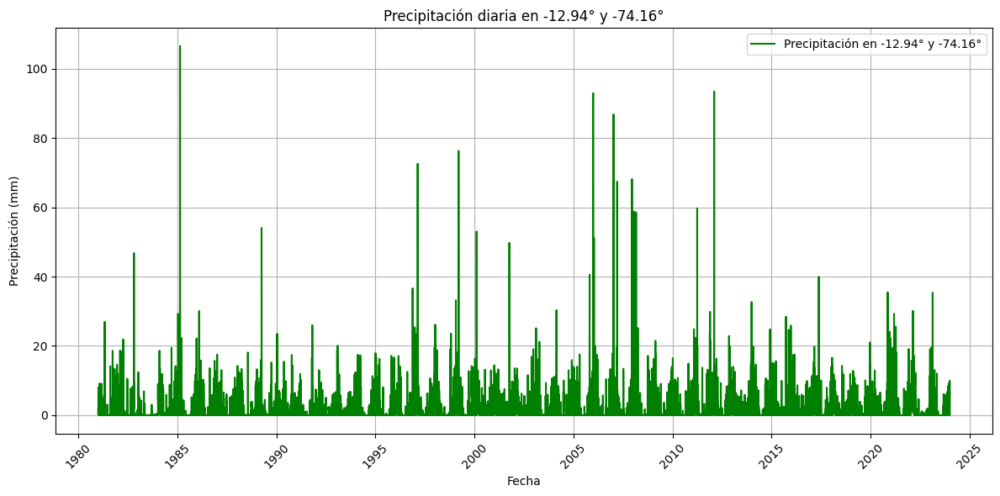

In [39]:
import matplotlib.pyplot as plt

# Definir el punto específico para graficar
lon_point = -74.16
lat_point = -12.94

# Obtener el índice del punto correspondiente
lon_idx = longitudes_unicas.index(lon_point)
lat_idx = latitudes_unicas.index(lat_point)

# Extraer los datos de precipitación para ese punto específico
precipitation_at_point = precipitation_xr[:, lat_idx, lon_idx].values

# Graficar
plt.figure(figsize=(12, 6))
plt.plot(dates, precipitation_at_point, label=f'Precipitación en {lat_point}° y {lon_point}°', color='green')
plt.title(f'Precipitación diaria en {lat_point}° y {lon_point}°')
plt.xlabel('Fecha')
plt.ylabel('Precipitación (mm)')
plt.xticks(rotation=45)
plt.grid()
plt.legend()
plt.tight_layout()

# Mostrar la gráfica
plt.show()


In [40]:
precipitation_at_point

array([1.65, 0.23, 0.37, ..., 5.43, 3.42, 0.19])

In [16]:
import pandas as pd
import xarray as xr
import numpy as np

# Leer el archivo CSV
file_path = 'D:/Paper_Climate/Data/siguiente paper/ncf4/CDBC-MERRA2-1.csv'
df = pd.read_csv(file_path)

# Extraer las fechas y los datos
dates = pd.to_datetime(df['Date'])  # Convertir las fechas a datetime
data = df.drop(columns=['Date']).values

# Convertir a una matriz NumPy
precipitation_matrix = np.array(data)

# Verificar las dimensiones
n_days = len(dates)  # Número de días
n_points = precipitation_matrix.shape[1]  # Número de puntos

# Extraer las etiquetas de lonXlat
lon_lat_labels = df.columns[1:]  # Encabezados de longitud y latitud
lon_lat_coords = [label.split('X') for label in lon_lat_labels]

# Crear listas de longitudes y latitudes
longitudes = []
latitudes = []

for coord in lon_lat_coords:
    if len(coord) == 2:  # Asegurarse de que hay dos elementos
        longitudes.append(float(coord[0]))
        latitudes.append(float(coord[1]))

# Convertir a conjuntos para eliminar duplicados
longitudes_unicas = sorted(set(longitudes))
latitudes_unicas = sorted(set(latitudes))

# Crear un mapa de las coordenadas únicas a índices
lon_index = {lon: idx for idx, lon in enumerate(longitudes_unicas)}
lat_index = {lat: idx for idx, lat in enumerate(latitudes_unicas)}

# Inicializar la matriz 3D de precipitación
n_lon = len(longitudes_unicas)
n_lat = len(latitudes_unicas)
precipitation_data_3d = np.zeros((n_days, n_lat, n_lon))

# Llenar la matriz 3D con datos
for i, label in enumerate(lon_lat_labels):
    lon, lat = map(float, label.split('X'))
    lon_idx = lon_index[lon]
    lat_idx = lat_index[lat]
    precipitation_data_3d[:, lat_idx, lon_idx] = precipitation_matrix[:, i]


# Convertir las fechas a un formato compatible
time_coords = np.array(dates)  # Asegurarse de que sea un array NumPy

# Reemplazar los ceros (sin datos) por NaN para evitar que se grafiquen en negro
#precipitation_data_3d[precipitation_data_3d == 0] = np.nan

# Crear el Dataset
xrds = xr.Dataset(
    data_vars={
        'precipitation': (['time', 'latitude', 'longitude'], precipitation_data_3d)  # Datos de precipitación
    },
    coords={
        'latitude': latitudes_unicas,  # Coordenadas de latitud
        'longitude': longitudes_unicas,  # Coordenadas de longitud
        'time': time_coords  # Coordenadas de tiempo
    },
    attrs={
        'description': 'Daily precipitation data',
        'units': 'mm'  # Unidades de los datos
    }
)

# Guardar en formato NetCDF
xrds.to_netcdf('D:/Y/precipitation_data_with_lat_lonok3.nc')

# Verificar la estructura del Dataset
print(xrds)


<xarray.Dataset>
Dimensions:        (time: 15705, latitude: 7, longitude: 8)
Coordinates:
  * latitude       (latitude) float64 -13.54 -13.44 -13.34 ... -13.04 -12.94
  * longitude      (longitude) float64 -74.66 -74.56 -74.46 ... -74.06 -73.96
  * time           (time) datetime64[ns] 1981-01-01 1981-01-02 ... 2023-12-31
Data variables:
    precipitation  (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Daily precipitation data
    units:        mm


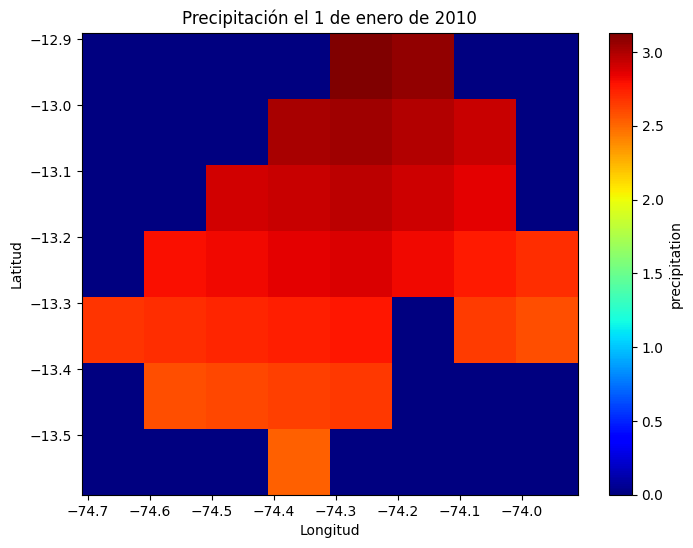

In [17]:
# Seleccionar los datos del 1 de enero de 2010
df_final = xrds['precipitation'].sel(time='2010-01-01')

# Graficar los datos
plt.figure(figsize=(8, 6))
df_final.plot(cmap='jet')
plt.title('Precipitación el 1 de enero de 2010')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

In [ ]:
global_attributes = pd.read_excel('multidimensional_sea_water_temperature_global_attributes.xlsx', index_col=0)

global_attributes

In [18]:
m = Basemap(projection='ortho', lon_0=-50, lat_0=40, resolution='l')

In [19]:
X,Y = np.meshgrid(lons, lats)
x,y = m(X,Y)
     

In [49]:
# cell 1: load the shapefile, check the filed or create the necessaary fields
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
font = {'family' : 'Times New Roman',
         'weight' : 'bold',
         'size'   : 20}
matplotlib.rc('font', **font)


# target shapefile is what we want the varibales to be remapped to; South Saskachewan River at Medicine Hat
shp = gpd.read_file('../data/ERA5_SSR_at_MedicineHat/target_shp/South_Saskatchewan_MedicineHat.shp')
if (shp.crs != 'epsg:4326'): # check if the projection is WGS84 (or epsg:4326)
    print('please project your shapefile to WGS84 (epsg:4326)')
print(shp.head()) # print the first five row of the shapefile
print(shp.columns) # print existing fields in the shapefile

# plotting
shp.geometry.boundary.plot(color=None,edgecolor='k',linewidth = .5, figsize=(20,20))
plt.xlabel('Lon')
plt.ylabel('Lat')
#https://github.com/ShervanGharari/candex/blob/master/candex/example_regular_lat_lon.ipynb
#https://github.com/MarcoMedri/JupLab4NetCDF/blob/master/Notebook/Manipulate-plot_CMEMSdata.ipynb

DriverError: ../data/ERA5_SSR_at_MedicineHat/target_shp/South_Saskatchewan_MedicineHat.shp: No such file or directory

In [42]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os
from matplotlib.animation import FuncAnimation
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import HTML



#print("Animation saved as 'precipitation_animation.mp4'")

MovieWriter ffmpeg unavailable; using Pillow instead.


ValueError: unknown file extension: .mp4

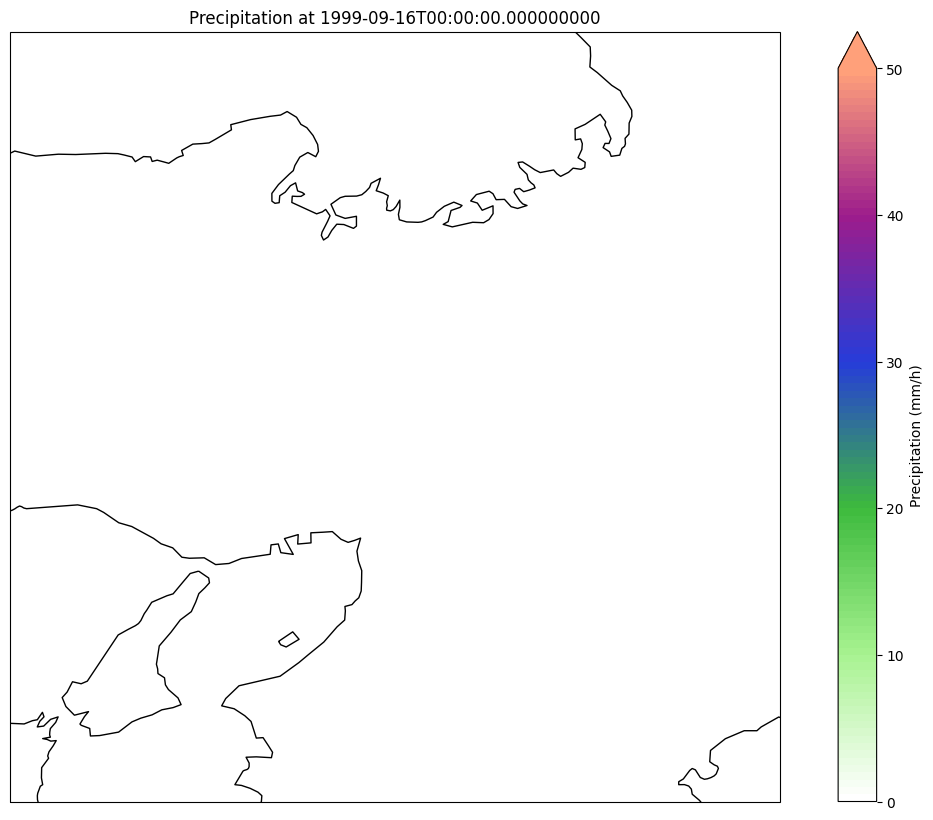

In [43]:
# NetCDFファイルを読み込む
ds = xr.open_dataset('D:/X/output_formatted.nc')

# カスタムカラーマップの定義
colors = ['#FFFFFF', '#A6F28F', '#3DBA3D', '#263CD9', '#9C1C8C', '#FFA07A']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=n_bins)

# プロットの設定
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# 地図の設定
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)
ax.set_extent([ds.lon.min(), ds.lon.max(), ds.lat.min(), ds.lat.max()])

# 初期フレームの作成
precip = ds.precip.isel(time=0)
im = ax.pcolormesh(ds.lon, ds.lat, precip, transform=ccrs.PlateCarree(), cmap=cmap, vmin=0, vmax=50)

# カラーバーの追加
cbar = plt.colorbar(im, extend='max')
cbar.set_label('Precipitation (mm/h)')

# タイトルの設定
title = ax.set_title('')

# アニメーション更新関数
def update(frame):
    precip = ds.precip.isel(time=frame)
    im.set_array(precip.values.ravel())
    title.set_text(f'Precipitation at {ds.time[frame].values}')
    return im, title

# アニメーションの作成
anim = FuncAnimation(fig, update, frames=len(ds.time), interval=200, blit=True)

# 動画として保存
anim.save('D:/X/extract_precipitation_animation.mp4', writer='ffmpeg', fps=5)

plt.close(fig)

In [44]:
from matplotlib.animation import PillowWriter  # Asegúrate de que Pillow esté instalado

# Guardar como GIF en lugar de MP4
anim.save('D:/X/extract_precipitation_animation.gif', writer=PillowWriter(fps=5))


In [ ]:
import dask.array as da
import numpy as np
import pandas as pd
from pathlib import Path
import xarray as xr


if __name__ == "__main__":
    lat = np.arange(-89.875, 90, 0.25)
    lon = np.arange(-179.875, 180, 0.25)
    time = pd.date_range("2000", "2020", freq="D")
    nlat, nlon, ntime = len(lat), len(lon), len(time)

    print("Dimension sizes:", nlat, nlon, ntime)
    print(f"Dataset size: {8 * nlat * nlon * ntime/1024**3:.2f}, GB")

    X = da.random.normal(
        loc=0, scale=1, size=(ntime, nlat, nlon), chunks=(1, nlat, nlon)
    )
    ds = xr.Dataset(
        {"X": (["time", "lat", "lon"], X)},
        coords={"time": time, "lat": lat, "lon": lon},
    )
    ds = ds.chunk({"time": 1, "lat": nlat, "lon": nlon})

    outpath = Path("large_testdata_time_first_images")
    outpath.mkdir(exist_ok=True)
    time = ds.time.to_pandas().index.to_pydatetime()
    for tstamp in time:
        fname = tstamp.strftime("testdata_%Y%m%d%H%M.nc")
        print("Writing image", fname)
        ds.sel(time=tstamp).to_netcdf(outpath / fname)

In [50]:
library(rgl)
library(anglr) #install this with devtools::install_github("hypertidy/anglr")
library(raster)

tas_DEM <- readAll(raster("~/Documents/Data/tasDEM_2015.tif"))
tas_DEM
plot(tas_DEM)

TWWHA <- shapefile("~/Documents/Data/TasmaniaWorldHertiageArea/Wha_region.shp")
TWWHA
#tas_DEM and TWWHA have the same projection (+proj=utm +zone=55 +south +ellps=GRS80 +units=m +no_defs) 
#so I am not checking that first. See elsewhere on help transforming and matching projections...
plot(TWWHA, add=TRUE, lwd=0.3)

#convert shape into a 3D mesh
TWWHA_meshed <- anglr(TWWHA)
TWWHA_meshed
plot(TWWHA_meshed)

#add z dimension (elevation) to the mesh
TWWHA_meshed$v$z_ <- extract(tas_DEM, as.matrix(TWWHA_meshed$v[, c("x_", "y_")]))
rgl.clear()
plot(TWWHA_meshed)
#rgl needs me to define the proportions of each dimension - elevation needs to be downscaled.
rgl::aspect3d(1, 1, 0.05)

#Its ugly because of big triangles lets make them smaller
TWWHA_meshed_small_tris <- anglr(TWWHA, max_area=1e6) #1e6 is total area in metres
TWWHA_meshed_small_tris$v$z_ <- extract(tas_DEM, as.matrix(TWWHA_meshed_small_tris$v[, c("x_", "y_")]), method="bilinear" )
rgl.clear()
plot(TWWHA_meshed_small_tris); rgl::aspect3d(1, 1, 0.05)

SyntaxError: invalid syntax (3554236856.py, line 21)

In [ ]:
library(ggplot2)
library(gganimate)
#library(ggplotly)
library(tidync)

tas <- tidync("/rdsi/private/climatefutures/ACCESS1-0/tas10km/tas_1hr_ccam_wine_access1-0_tas10km.2000-2009.nc") %>%
  hyper_filter(time = index < 366) %>%
  hyper_tibble()
clh <- tidync("/rdsi/private/climatefutures/ACCESS1-0/tas10km/clh_1hr_ccam_wine_access1-0_tas10km.2000-2009.nc") %>%
  hyper_filter(time = index < 366) %>%
  hyper_tibble()
clm <- tidync("/rdsi/private/climatefutures/ACCESS1-0/tas10km/clm_1hr_ccam_wine_access1-0_tas10km.2000-2009.nc") %>%
  hyper_filter(time = index < 366) %>%
  hyper_tibble()
cll <- tidync("/rdsi/private/climatefutures/ACCESS1-0/tas10km/cll_1hr_ccam_wine_access1-0_tas10km.2000-2009.nc") %>%
  hyper_filter(time = index < 366) %>%
  hyper_tibble()

#Aus <- raster::getData("GADM_2.8_AUS_adm0.rds", level=0)

plotted_layers <- ggplot(data=tas, aes(lon, lat, frame=time, fill=tas)) + 
  theme_void() + 
  geom_raster(interpolate = TRUE) +
  scale_fill_gradientn(
    name="Surface\nTemperature", 
    colours = rev(c("firebrick", "red", "orange", "yellow", "green", "dodgerblue2", "dodgerblue3", "dodgerblue4")),
    breaks = seq(273,323, length=6), 
    labels = c(0, 10, 20, 30, 40, 50), 
    limits = c(270, 310)
  ) +
  geom_raster(data=cll, aes(lon, lat, alpha=cll/100, fill=NULL), fill="grey90", interpolate = TRUE) + 
  geom_raster(data=clm, aes(lon, lat, alpha=clm/100, fill=NULL), fill="grey95", interpolate = TRUE) +
  geom_raster(data=clh, aes(alpha = clh/100), fill="white", interpolate = TRUE) +
  scale_alpha_continuous(guide=FALSE, limits=c(0,1))

gganimate(
  plotted_layers, 
  "/mnt/WineAustralia_working_files/animations/ANIMATION-tas10km-1hrly-surface-temperature-with-cloud-at-lmh.gif", 
  interval = 0.23
  )

In [ ]:
#https://github.com/bagasanin000/Time_Series_Animation_NetCDF_ERA5/blob/main/Python/NZ_monthly_temp_analysis_UP.ipynb